# Violence Detection v3 — Face Identity Stabilized

| Run | What happens |
|-----|--------------|
| First run | Download Hockey Fight → extract features (RWF-2000 + Hockey) → train → save |
| Later runs | Load saved model → run inference |

**Architecture:** Input Projection → BiLSTM → LayerNorm → MHA → MaxPool → Classifier  
**Size:** ~91K params · 0.36 MB FP32 · ~91 KB INT8  
**Training data:** RWF-2000 (1,603 clips) + Hockey Fight (1,000 clips) = 2,603 clips  
**Goals:** High accuracy · Low false positives · Smooth stable predictions · Integration-ready JSON

---

In [1]:
!pip install ultralytics supervision scikit-learn -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 33.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 217.4/217.4 kB 11.0 MB/s eta 0:00:00


In [2]:
import os, cv2, time, shutil, json
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from tqdm import tqdm
from collections import deque, defaultdict
from ultralytics import YOLO
import supervision as sv
from sklearn.metrics import (
    f1_score, accuracy_score, precision_score, recall_score,
    confusion_matrix, classification_report,
    precision_recall_curve, roc_auc_score
)
import matplotlib.pyplot as plt
from IPython.display import display, HTML

device_torch = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device_yolo  = 0 if torch.cuda.is_available() else 'cpu'
print(f'PyTorch {torch.__version__} | CUDA {torch.cuda.is_available()} | {device_torch}')
if torch.cuda.is_available():
    print(f'GPU: {torch.cuda.get_device_name(0)}')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
PyTorch 2.10.0+cu128 | CUDA True | cuda
GPU: Tesla T4


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
DATASET_BASE    = '/content/drive/MyDrive/RWF2000/RWF-2000'
FEATURE_BASE    = '/content/drive/MyDrive/RWF2000/pose_features_v3'
MODEL_PATH      = '/content/drive/MyDrive/RWF2000/best_model_v3.pth'
MEAN_PATH       = os.path.join(FEATURE_BASE, 'mean.npy')
STD_PATH        = os.path.join(FEATURE_BASE, 'std.npy')
HISTORY_PATH    = '/content/drive/MyDrive/RWF2000/train_history_v3.npy'
LOCAL_FEAT_BASE = '/content/pose_features_v3_local'

# Hockey Fight — stored permanently in Drive
HOCKEY_RAW_DIR  = '/content/drive/MyDrive/RWF2000/datasets/HockeyFight'
HOCKEY_FEAT_DIR = '/content/drive/MyDrive/RWF2000/pose_features_hockey'
HOCKEY_LOCAL    = '/content/pose_features_hockey_local'

TRAIN_VIDEO_DIR = os.path.join(DATASET_BASE, 'train')
VAL_VIDEO_DIR   = os.path.join(DATASET_BASE, 'val')
TRAIN_FEAT_DIR  = os.path.join(FEATURE_BASE, 'train')
VAL_FEAT_DIR    = os.path.join(FEATURE_BASE, 'val')

FEATURE_DIM = 126
PERSON_DIM  = 60
SEQ_LEN     = 60
USE_HOCKEY  = True   # set False to train on RWF-2000 only

MODEL_EXISTS  = os.path.exists(MODEL_PATH)
NORM_EXISTS   = os.path.exists(MEAN_PATH) and os.path.exists(STD_PATH)
SKIP_TRAINING = MODEL_EXISTS and NORM_EXISTS

print(f'Model   : {"found" if MODEL_EXISTS else "missing"}')
print(f'Norm    : {"found" if NORM_EXISTS  else "missing"}')
print(f'Hockey  : {"enabled" if USE_HOCKEY else "disabled"}')
print(f'Action  : {"SKIP TRAINING" if SKIP_TRAINING else "WILL TRAIN"}')
print()
print('Drive layout:')
print('  MyDrive/RWF2000/')
print('    datasets/HockeyFight/Fight|NonFight  <- videos (permanent)')
print('    pose_features_v3/                   <- RWF-2000 features')
print('    pose_features_hockey/               <- Hockey features')
print('    best_model_v3.pth')


Model   : missing
Norm    : found
Hockey  : enabled
Action  : WILL TRAIN

Drive layout:
  MyDrive/RWF2000/
    datasets/HockeyFight/Fight|NonFight  <- videos (permanent)
    pose_features_v3/                   <- RWF-2000 features
    pose_features_hockey/               <- Hockey features
    best_model_v3.pth


In [5]:
if not SKIP_TRAINING and USE_HOCKEY:
    import zipfile

    HOCKEY_FIGHT_DIR    = os.path.join(HOCKEY_RAW_DIR, 'Fight')
    HOCKEY_NONFIGHT_DIR = os.path.join(HOCKEY_RAW_DIR, 'NonFight')
    os.makedirs(HOCKEY_FIGHT_DIR,    exist_ok=True)
    os.makedirs(HOCKEY_NONFIGHT_DIR, exist_ok=True)
    os.makedirs('/content/drive/MyDrive/RWF2000/datasets', exist_ok=True)

    fight_count    = len([f for f in os.listdir(HOCKEY_FIGHT_DIR)    if f.endswith('.avi')])
    nonfight_count = len([f for f in os.listdir(HOCKEY_NONFIGHT_DIR) if f.endswith('.avi')])

    if fight_count >= 500 and nonfight_count >= 500:
        print(f'Hockey already in Drive: Fight={fight_count}, NonFight={nonfight_count}')
    else:
        # Zip saved to Drive so it survives Colab session resets
        zip_path = '/content/drive/MyDrive/RWF2000/datasets/hockey_fight.zip'

        if os.path.exists(zip_path):
            print('Zip already on Drive — skipping download.')
        else:
            print('Downloading Hockey Fight to Drive (~800 MB)...')
            try:
                import subprocess
                subprocess.run(['pip','install','kaggle','-q'], check=True)
                kaggle_json = '/content/drive/MyDrive/kaggle.json'
                if os.path.exists(kaggle_json):
                    os.makedirs(os.path.expanduser('~/.kaggle'), exist_ok=True)
                    shutil.copy2(kaggle_json, os.path.expanduser('~/.kaggle/kaggle.json'))
                    os.chmod(os.path.expanduser('~/.kaggle/kaggle.json'), 0o600)
                subprocess.run([
                    'kaggle','datasets','download',
                    '-d','yassershrief/hockey-fight-vidoes',
                    '-p','/content/drive/MyDrive/RWF2000/datasets/',
                    '--quiet'
                ], check=True)
                raw_zip = '/content/drive/MyDrive/RWF2000/datasets/hockey-fight-vidoes.zip'
                if os.path.exists(raw_zip):
                    os.rename(raw_zip, zip_path)
                print('Downloaded via Kaggle.')
            except Exception as e:
                print(f'Kaggle failed: {e}  — trying gdown...')
                try:
                    import subprocess
                    subprocess.run(['pip','install','gdown','-q'], check=True)
                    subprocess.run([
                        'gdown','--id','1e07C8Hj2VZBJ5dIZq1YDGQ2aFRi4fQrE',
                        '-O', zip_path, '--quiet'
                    ], check=True)
                    print('Downloaded via gdown.')
                except Exception as e2:
                    print(f'Both download methods failed: {e2}')
                    print('Manual option:')
                    print('  Upload hockey_fight.zip to:')
                    print('  /content/drive/MyDrive/RWF2000/datasets/hockey_fight.zip')
                    print('  Then re-run this cell.')
                    zip_path = None

        if zip_path and os.path.exists(zip_path):
            print('Extracting to Drive...')
            extract_tmp = '/content/hockey_raw_tmp'
            os.makedirs(extract_tmp, exist_ok=True)
            with zipfile.ZipFile(zip_path, 'r') as zf:
                zf.extractall(extract_tmp)

            all_avi = []
            for root, dirs, files in os.walk(extract_tmp):
                for f in files:
                    if f.endswith('.avi'): all_avi.append(os.path.join(root, f))

            moved = {'Fight': 0, 'NonFight': 0}
            for src_path in all_avi:
                fname = os.path.basename(src_path).lower()
                if   fname.startswith('fi'): cls = 'Fight'
                elif fname.startswith('no'): cls = 'NonFight'
                else: continue
                dst = os.path.join(HOCKEY_RAW_DIR, cls, os.path.basename(src_path))
                if not os.path.exists(dst):
                    shutil.copy2(src_path, dst)
                    moved[cls] += 1

            shutil.rmtree(extract_tmp, ignore_errors=True)
            print(f'Sorted to Drive: Fight={moved["Fight"]}, NonFight={moved["NonFight"]}')
            # Zip kept on Drive as backup.
            # Delete manually if you need space: os.remove(zip_path)

    fc = len([f for f in os.listdir(HOCKEY_FIGHT_DIR)    if f.endswith('.avi')])
    nc = len([f for f in os.listdir(HOCKEY_NONFIGHT_DIR) if f.endswith('.avi')])
    print(f'Hockey ready: Fight={fc}, NonFight={nc}')
    print(f'Location: {HOCKEY_RAW_DIR}')
else:
    print('Skipping Hockey download.')


Downloaded via Kaggle.
Extracting to Drive...
Sorted to Drive: Fight=500, NonFight=500
Hockey ready: Fight=500, NonFight=500
Location: /content/drive/MyDrive/RWF2000/datasets/HockeyFight


## Feature Extraction

In [7]:
# These functions are needed for BOTH training extraction and inference.
# Defined unconditionally so they are available on every run.

def _angle_3pt(a, b, c):
    ba = a - b; bc = c - b
    return float(np.clip(np.dot(ba, bc) / (np.linalg.norm(ba) * np.linalg.norm(bc) + 1e-6), -1, 1))

def _limb_angle_2pt(a, b, W, H):
    return float(np.arctan2((b[1]-a[1])/H, (b[0]-a[0])/W) / np.pi)

def _segment_energy(kps_now, kps_prev, pairs):
    if kps_prev is None: return 0.0
    return sum(np.linalg.norm(kps_now[i]-kps_prev[i]) + np.linalg.norm(kps_now[j]-kps_prev[j])
               for i,j in pairs) / (2*len(pairs) + 1e-6)

_ARM_SEGS  = [(5,7),(7,9),(6,8),(8,10)]
_LEG_SEGS  = [(11,13),(13,15),(12,14),(14,16)]
_TORSO_SEG = [(5,6),(5,11),(6,12),(11,12)]
_HEAD_SEG  = [(0,1),(0,2),(1,3),(2,4)]

def extract_person_features(kps, kps_prev, xc, yc, x1, y1, x2, y2,
                             dx, dy, ddx, ddy, dddx, dddy, kp_conf, W, H):
    bw = max(x2-x1, 1.0); bh = max(y2-y1, 1.0)
    kp_norm    = np.array([[(kps[i,0]-x1)/bw, (kps[i,1]-y1)/bh]
                            for i in range(17)], dtype=np.float32).flatten()
    kinematics = np.array([dx, dy, ddx, ddy, dddx, dddy], dtype=np.float32)
    ra = _limb_angle_2pt(kps[6], kps[10], W, H)
    la = _limb_angle_2pt(kps[5], kps[9],  W, H)
    hm = (kps[11]+kps[12])/2; sm = (kps[5]+kps[6])/2
    limb_ang   = np.array([ra, la, _limb_angle_2pt(hm, sm, W, H)], dtype=np.float32)
    joint_ang  = np.array([
        _angle_3pt(kps[6],  kps[8],  kps[10]),
        _angle_3pt(kps[5],  kps[7],  kps[9]),
        _angle_3pt(kps[12], kps[14], kps[16]),
        _angle_3pt(kps[11], kps[13], kps[15]),
        _angle_3pt(kps[5],  kps[11], kps[13]),
    ], dtype=np.float32)
    motion_e   = np.array([
        _segment_energy(kps, kps_prev, _ARM_SEGS),
        _segment_energy(kps, kps_prev, _LEG_SEGS),
        _segment_energy(kps, kps_prev, _TORSO_SEG),
        _segment_energy(kps, kps_prev, _HEAD_SEG),
    ], dtype=np.float32)
    bbox_area  = np.array([(bw*bh)/(W*H)], dtype=np.float32)
    conf_mean  = np.array([float(np.mean(kp_conf))], dtype=np.float32)
    pose_spd   = np.array([float(np.mean(np.linalg.norm(kps-kps_prev, axis=1))) / (W+1e-6)
                            if kps_prev is not None else 0.0], dtype=np.float32)
    r_raise    = max(0.0, float((kps[6,1]-kps[10,1])/bh))
    l_raise    = max(0.0, float((kps[5,1]-kps[9,1])/bh))
    arm_raise  = np.array([max(r_raise, l_raise)], dtype=np.float32)
    asym       = np.array([abs(dx)-abs(dy), abs(ra-la), abs(r_raise-l_raise)], dtype=np.float32)
    pad        = np.zeros(1, dtype=np.float32)
    pf = np.concatenate([kp_norm, kinematics, limb_ang, joint_ang,
                          motion_e, bbox_area, conf_mean, pose_spd,
                          arm_raise, asym, pad])
    assert pf.shape == (PERSON_DIM,)
    return pf

def compute_interaction(centers, velocities, bboxes, kps_list):
    (x1c,y1c),(x2c,y2c) = centers[0], centers[1]
    rel_pos  = np.array([x1c-x2c, y1c-y2c])
    distance = float(np.linalg.norm(rel_pos))
    rel_vel  = np.array(velocities[0]) - np.array(velocities[1])
    approach_vel = float(np.dot(rel_pos, rel_vel) / (distance+1e-6))
    b1, b2 = bboxes[0], bboxes[1]
    inter = max(0.,min(b1[2],b2[2])-max(b1[0],b2[0])) * max(0.,min(b1[3],b2[3])-max(b1[1],b2[1]))
    iou   = inter / ((b1[2]-b1[0])*(b1[3]-b1[1]) + (b2[2]-b2[0])*(b2[3]-b2[1]) - inter + 1e-6)
    s1 = np.linalg.norm(velocities[0]); s2 = np.linalg.norm(velocities[1])
    heading_align = float(-np.dot(np.array(velocities[0])/(s1+1e-6),
                                   np.array(velocities[1])/(s2+1e-6)))
    motion_sync   = 1.0 - abs(s1-s2)/(s1+s2+1e-6)
    return np.array([distance, approach_vel, iou, abs(s1-s2),
                     heading_align, motion_sync], dtype=np.float32)

def select_persons(dets, W, H, n=2):
    if len(dets) <= n: return list(range(len(dets)))
    areas  = [(dets.xyxy[i,2]-dets.xyxy[i,0])*(dets.xyxy[i,3]-dets.xyxy[i,1])
              for i in range(len(dets))]
    max_a  = max(areas)+1e-6
    scores = [(areas[i]/max_a)*(1-np.sqrt(((dets.xyxy[i,0]+dets.xyxy[i,2])/2/W-0.5)**2 +
                                           ((dets.xyxy[i,1]+dets.xyxy[i,3])/2/H-0.5)**2))
              for i in range(len(dets))]
    return sorted(range(len(scores)), key=lambda i: -scores[i])[:n]

print('Feature functions ready (always available for training + inference).')


Feature functions ready (always available for training + inference).


In [8]:
if not SKIP_TRAINING:
    pose_model_ext = YOLO('yolov8s-pose.pt')
    tracker_ext    = sv.ByteTrack()

    def extract_video_features(video_path):
        cap = cv2.VideoCapture(video_path)
        prev_centers = {}; prev_vel = {}; prev_acc = {}; prev_kps = {}
        tracker_ext.reset()
        sequence = []; frame_idx = 0

        while True:
            ret, frame = cap.read()
            if not ret: break
            frame_idx += 1
            if frame_idx % 2 != 0: continue

            H, W = frame.shape[:2]
            result = pose_model_ext(frame, device=device_yolo, conf=0.25, verbose=False)[0]
            dets   = sv.Detections.from_ultralytics(result)

            if len(dets) == 0 or not any(dets.class_id == 0):
                sequence.append(np.zeros(FEATURE_DIM, dtype=np.float32)); continue

            dets    = sv.Detections.from_ultralytics(result)
            dets    = dets[dets.class_id == 0]
            dets    = tracker_ext.update_with_detections(dets)
            indices = select_persons(dets, W, H)

            person_feats = []; centers = []; velocities = []; bboxes = []; kps_list = []

            for idx in indices:
                x1,y1,x2,y2 = dets.xyxy[idx]
                tid = int(dets.tracker_id[idx])
                xc  = (x1+x2)/2/W; yc = (y1+y2)/2/H
                centers.append((xc,yc)); bboxes.append([x1,y1,x2,y2])

                try:
                    kps     = result.keypoints.xy[idx].cpu().numpy().astype(np.float32)
                    kp_conf = result.keypoints.conf[idx].cpu().numpy() \
                              if result.keypoints.conf is not None else np.ones(17, dtype=np.float32)
                except:
                    kps = np.zeros((17,2), dtype=np.float32); kp_conf = np.zeros(17, dtype=np.float32)

                dx=dy=ddx=ddy=dddx=dddy=0.0
                if tid in prev_centers: px,py=prev_centers[tid]; dx,dy=xc-px,yc-py
                if tid in prev_vel:     pdx,pdy=prev_vel[tid];   ddx,ddy=dx-pdx,dy-pdy
                if tid in prev_acc:     pddx,pddy=prev_acc[tid]; dddx,dddy=ddx-pddx,ddy-pddy

                velocities.append((dx,dy))
                prev_centers[tid]=(xc,yc); prev_vel[tid]=(dx,dy); prev_acc[tid]=(ddx,ddy)

                pf = extract_person_features(kps, prev_kps.get(tid), xc, yc, x1, y1, x2, y2,
                                             dx, dy, ddx, ddy, dddx, dddy, kp_conf, W, H)
                prev_kps[tid] = kps.copy()
                person_feats.append(pf); kps_list.append(kps)

            while len(person_feats) < 2: person_feats.append(np.zeros(PERSON_DIM, dtype=np.float32))
            while len(centers)      < 2: centers.append((0.5,0.5))
            while len(velocities)   < 2: velocities.append((0.,0.))
            while len(bboxes)       < 2: bboxes.append([0.,0.,1.,1.])
            while len(kps_list)     < 2: kps_list.append(np.zeros((17,2), dtype=np.float32))

            inter = compute_interaction(centers, velocities, bboxes, kps_list)
            ff    = np.concatenate([person_feats[0], person_feats[1], inter]).astype(np.float32)
            assert ff.shape == (FEATURE_DIM,)
            sequence.append(ff)

        cap.release()
        if len(sequence) >= SEQ_LEN:
            return np.stack(sequence[:SEQ_LEN]).astype(np.float32)
        pad = np.zeros((SEQ_LEN-len(sequence), FEATURE_DIM), dtype=np.float32)
        return np.vstack([np.stack(sequence).astype(np.float32), pad]) if sequence else pad

    print('extract_video_features ready.')
else:
    print('Skipping extraction setup.')

extract_video_features ready.


In [9]:
if not SKIP_TRAINING:

    for _s in ['train','val']:
        for _c in ['Fight','NonFight']:
            os.makedirs(os.path.join(LOCAL_FEAT_BASE,_s,_c), exist_ok=True)
            os.makedirs(os.path.join(FEATURE_BASE,_s,_c),    exist_ok=True)

    def _drive_alive():
        try: os.listdir('/content/drive/MyDrive'); return True
        except OSError: return False

    def _flush(local_dir, drive_dir):
        if not _drive_alive(): return
        for f in os.listdir(local_dir):
            if f.endswith('.npy'):
                dst = os.path.join(drive_dir, f)
                if not os.path.exists(dst):
                    try: shutil.copy2(os.path.join(local_dir,f), dst)
                    except OSError: pass

    def _count_npy(d):
        return sum(1 for f in os.listdir(d) if f.endswith('.npy')) if os.path.isdir(d) else 0

    def extract_split(vid_dir, local_base, drive_base, split):
        for cls in ['Fight','NonFight']:
            src = os.path.join(vid_dir,cls); local_dst=os.path.join(local_base,cls)
            drive_dst = os.path.join(drive_base,cls)
            files = [f for f in os.listdir(src) if f.endswith(('.avi','.mp4'))]
            print(f'  {split}/{cls}: {len(files)} videos')
            pending = 0
            for fname in tqdm(files, desc=f'{split}/{cls}'):
                stem = os.path.splitext(fname)[0]
                lp   = os.path.join(local_dst, stem+'.npy')
                dp   = os.path.join(drive_dst, stem+'.npy')
                if os.path.exists(dp): continue
                if not os.path.exists(lp):
                    np.save(lp, extract_video_features(os.path.join(src,fname)))
                pending += 1
                if pending >= 25: _flush(local_dst, drive_dst); pending=0
            _flush(local_dst, drive_dst)

    tr_n = sum(_count_npy(os.path.join(FEATURE_BASE,'train',c)) for c in ['Fight','NonFight'])
    va_n = sum(_count_npy(os.path.join(FEATURE_BASE,'val',  c)) for c in ['Fight','NonFight'])

    if tr_n + va_n >= 2003:
        print(f'Features cached (train={tr_n}, val={va_n}).')
        TRAIN_FEAT_DIR = os.path.join(FEATURE_BASE,'train')
        VAL_FEAT_DIR   = os.path.join(FEATURE_BASE,'val')
    else:
        print(f'Extracting (have train={tr_n}, val={va_n})...')
        extract_split(TRAIN_VIDEO_DIR, os.path.join(LOCAL_FEAT_BASE,'train'),
                      os.path.join(FEATURE_BASE,'train'), 'train')
        extract_split(VAL_VIDEO_DIR,   os.path.join(LOCAL_FEAT_BASE,'val'),
                      os.path.join(FEATURE_BASE,'val'),   'val')
        TRAIN_FEAT_DIR = os.path.join(LOCAL_FEAT_BASE,'train')
        VAL_FEAT_DIR   = os.path.join(LOCAL_FEAT_BASE,'val')
        print('Extraction complete.')
else:
    print('Skipping extraction.')

Features cached (train=1603, val=400).


In [10]:
if not SKIP_TRAINING and USE_HOCKEY:
    import shutil as _shutil_hk

    def _drive_alive_hk():
        try: os.listdir('/content/drive/MyDrive'); return True
        except OSError: return False

    def _flush_hk(local_dir, drive_dir):
        if not _drive_alive_hk(): return
        for f in os.listdir(local_dir):
            if f.endswith('.npy'):
                dst = os.path.join(drive_dir, f)
                if not os.path.exists(dst):
                    try: _shutil_hk.copy2(os.path.join(local_dir,f), dst)
                    except OSError: pass

    def _count_npy_dir(d):
        return sum(1 for f in os.listdir(d) if f.endswith('.npy')) if os.path.isdir(d) else 0

    for _c in ['Fight','NonFight']:
        os.makedirs(os.path.join(HOCKEY_LOCAL,    _c), exist_ok=True)
        os.makedirs(os.path.join(HOCKEY_FEAT_DIR, _c), exist_ok=True)

    hf_cached  = _count_npy_dir(os.path.join(HOCKEY_FEAT_DIR,'Fight'))
    hnf_cached = _count_npy_dir(os.path.join(HOCKEY_FEAT_DIR,'NonFight'))

    if hf_cached >= 490 and hnf_cached >= 490:
        print(f'Hockey features cached: Fight={hf_cached}, NonFight={hnf_cached}')
    else:
        print(f'Extracting Hockey features (cached: Fight={hf_cached}, NonFight={hnf_cached})...')
        for cls in ['Fight','NonFight']:
            src       = os.path.join(HOCKEY_RAW_DIR, cls)
            local_dst = os.path.join(HOCKEY_LOCAL,    cls)
            drive_dst = os.path.join(HOCKEY_FEAT_DIR,  cls)
            if not os.path.isdir(src):
                print(f'  {cls} not found at {src} — skipping')
                continue
            files = [f for f in os.listdir(src) if f.endswith(('.avi','.mp4'))]
            print(f'  Hockey/{cls}: {len(files)} videos')
            pending = 0
            for fname in tqdm(files, desc=f'Hockey/{cls}'):
                stem = os.path.splitext(fname)[0]
                lp   = os.path.join(local_dst, stem+'.npy')
                dp   = os.path.join(drive_dst, stem+'.npy')
                if os.path.exists(dp): continue
                if not os.path.exists(lp):
                    np.save(lp, extract_video_features(os.path.join(src,fname)))
                pending += 1
                if pending >= 25: _flush_hk(local_dst, drive_dst); pending=0
            _flush_hk(local_dst, drive_dst)
            print(f'  Hockey/{cls} done.')
        print('Hockey extraction complete.')
else:
    print('Skipping Hockey extraction.')


Extracting Hockey features (cached: Fight=0, NonFight=0)...
  Hockey/Fight: 500 videos


Hockey/Fight: 100%|██████████| 500/500 [03:01<00:00,  2.76it/s]


  Hockey/Fight done.
  Hockey/NonFight: 500 videos


Hockey/NonFight: 100%|██████████| 500/500 [02:47<00:00,  2.98it/s]


  Hockey/NonFight done.
Hockey extraction complete.


In [11]:
if not SKIP_TRAINING:
    all_feat = []; skipped = 0

    def _load_dir_features(feat_dir):
        for cls in ['Fight','NonFight']:
            folder = os.path.join(feat_dir, cls)
            if not os.path.isdir(folder): continue
            for fname in sorted(f for f in os.listdir(folder) if f.endswith('.npy')):
                try:
                    arr = np.load(os.path.join(folder, fname))
                    if arr.shape == (SEQ_LEN, FEATURE_DIM): all_feat.append(arr)
                    else: skipped += 1
                except: skipped += 1

    _load_dir_features(TRAIN_FEAT_DIR)
    print(f'  RWF-2000 train: {len(all_feat)} arrays')

    if USE_HOCKEY:
        before = len(all_feat)
        # Prefer Drive copy, fall back to local
        hk_dir = HOCKEY_FEAT_DIR if os.path.isdir(os.path.join(HOCKEY_FEAT_DIR,'Fight')) \
                 else HOCKEY_LOCAL
        _load_dir_features(hk_dir)
        print(f'  Hockey Fight  : {len(all_feat)-before} arrays  (from {hk_dir})')

    if skipped: print(f'  Skipped {skipped} bad files')
    print(f'  Total for norm: {len(all_feat)} arrays')
    all_feat = np.concatenate(all_feat, axis=0)
    mean = np.mean(all_feat, axis=0)
    std  = np.std(all_feat,  axis=0); std[std<1e-3]=1e-3
    np.save(MEAN_PATH, mean); np.save(STD_PATH, std)
    print(f'Normalization saved (shape: {mean.shape})')
else:
    print('Skipping norm stats.')


  RWF-2000 train: 1603 arrays
  Hockey Fight  : 1000 arrays  (from /content/drive/MyDrive/RWF2000/pose_features_hockey)
  Total for norm: 2603 arrays
Normalization saved (shape: (126,))


## Model & Training

In [12]:
if not SKIP_TRAINING:

    def mixup(x1, y1, x2, y2, alpha=0.3):
        lam = float(np.random.beta(alpha, alpha))
        return lam*x1+(1-lam)*x2, lam*y1+(1-lam)*y2

    class ViolenceDataset(Dataset):
        def __init__(self, feat_dirs, mean, std, augment=False):
            self.mean    = mean.astype(np.float32)
            self.std     = std.astype(np.float32)
            self.augment = augment
            self.samples = []
            for feat_dir in feat_dirs:
                domain = 'hockey' if 'hockey' in feat_dir.lower() else 'rwf'
                for label, cls in enumerate(['NonFight', 'Fight']):
                    folder = os.path.join(feat_dir, cls)
                    if not os.path.isdir(folder): continue
                    for f in sorted(os.listdir(folder)):
                        if f.endswith('.npy'):
                            p = os.path.join(folder, f)
                            try:
                                if os.path.getsize(p) > 0:
                                    self.samples.append((p, label, domain))
                            except OSError: pass
            rwf_f  = sum(1 for s in self.samples if s[2]=='rwf'    and s[1]==1)
            rwf_nf = sum(1 for s in self.samples if s[2]=='rwf'    and s[1]==0)
            hk_f   = sum(1 for s in self.samples if s[2]=='hockey' and s[1]==1)
            hk_nf  = sum(1 for s in self.samples if s[2]=='hockey' and s[1]==0)
            print(f'  RWF   Fight={rwf_f}  NonFight={rwf_nf}')
            print(f'  Hockey Fight={hk_f}  NonFight={hk_nf}  <- hard negatives')
            print(f'  Total: {len(self.samples)}')

        def __len__(self): return len(self.samples)

        def get_sample_weights(self):
            fight_n    = sum(1 for s in self.samples if s[1]==1)
            nonfight_n = sum(1 for s in self.samples if s[1]==0)
            base = {0: 1.0/nonfight_n, 1: 1.0/fight_n}
            weights = []
            for _, label, domain in self.samples:
                w = base[label]
                if domain == 'hockey' and label == 0: w *= 2.0
                elif domain == 'hockey' and label == 1: w *= 1.5
                weights.append(w)
            return weights

        def _load(self, idx):
            path, label, domain = self.samples[idx]
            try:
                feat = np.load(path).copy().astype(np.float32)
                if feat.shape != (SEQ_LEN, FEATURE_DIM):
                    feat = np.zeros((SEQ_LEN, FEATURE_DIM), dtype=np.float32)
            except:
                feat = np.zeros((SEQ_LEN, FEATURE_DIM), dtype=np.float32)
            return feat, float(label), domain

        def __getitem__(self, idx):
            feat, label, domain = self._load(idx)

            if self.augment:
                # 1. Temporal jitter
                if np.random.rand() > 0.5 and len(feat) > 48:
                    s    = np.random.randint(0, len(feat)-48)
                    feat = np.vstack([feat[s:s+48],
                                      np.zeros((SEQ_LEN-48, FEATURE_DIM), dtype=np.float32)])
                # 2. Temporal reversal
                if np.random.rand() > 0.7: feat = feat[::-1].copy()
                # 3. Kinematic noise on motion dims only
                if np.random.rand() > 0.5:
                    mask = np.zeros_like(feat)
                    mask[:, 34:44]=1; mask[:, 94:104]=1
                    feat += np.random.normal(0, 0.025, feat.shape).astype(np.float32)*mask
                # 4. Left-right mirror swapping person A and B
                if np.random.rand() > 0.5:
                    tmp = feat[:, :PERSON_DIM].copy()
                    feat[:, :PERSON_DIM]             = feat[:, PERSON_DIM:PERSON_DIM*2]
                    feat[:, PERSON_DIM:PERSON_DIM*2] = tmp
                    feat[:, 0::2] = -feat[:, 0::2]
                # 5. Speed scaling
                if np.random.rand() > 0.6:
                    scale = np.random.uniform(0.7, 1.3)
                    feat[:, 34:44]*=scale; feat[:, 94:104]*=scale
                # 6. Interaction dropout
                if np.random.rand() > 0.65:
                    feat[:, PERSON_DIM*2:] *= float(np.random.choice([0.0, 1.0]))
                # 7. Keypoint dropout — simulates occluded joints
                if np.random.rand() > 0.7:
                    drop = np.random.rand(34) > 0.15
                    feat[:, :34]  *= drop
                    feat[:, 60:94] *= drop
                # 8. Domain-aware MixUp — only within same domain
                if np.random.rand() > 0.75:
                    same = [i for i,(p,l,d) in enumerate(self.samples) if d==domain]
                    idx2 = same[np.random.randint(len(same))]
                    feat2, label2, _ = self._load(idx2)
                    feat2  = (feat2 - self.mean) / self.std
                    feat_n = (feat  - self.mean) / self.std
                    fm, lm = mixup(feat_n, label, feat2, label2)
                    return (torch.tensor(fm, dtype=torch.float32),
                            torch.tensor(lm, dtype=torch.float32))

            feat = (feat - self.mean) / self.std
            return (torch.tensor(feat,  dtype=torch.float32),
                    torch.tensor(label, dtype=torch.float32))

    print('ViolenceDataset ready (domain-aware hard negative weighting).')
else:
    print('Skipping dataset class.')


ViolenceDataset ready (domain-aware hard negative weighting).


In [13]:
class ViolenceDetectorV3(nn.Module):
    """
    Input: (B, T=60, F=126)  Output: (logit, attn_weights)
    Params: ~152K | 0.61 MB FP32 | ~152 KB INT8

    Architecture designed to separate what each person is doing
    from how they are interacting. This is the key to avoiding
    false positives on sports: a hockey player swinging their
    stick alone is high-motion but the interaction features
    (approach velocity, IoU, heading alignment) are very different
    from two people actively fighting.

    Stream layout:
      Person A (60d) ─┐
                       ├─ merge → BiLSTM → Attention → Classifier
      Person B (60d) ─┤
      Interaction (6d)─┘
    """
    def __init__(self, input_dim=126, person_dim=60, hidden_dim=64,
                 num_heads=4, num_layers=2, dropout=0.4):
        super().__init__()
        inter_dim = input_dim - 2 * person_dim   # 6

        self.person_enc = nn.Sequential(
            nn.Linear(person_dim, hidden_dim),
            nn.LayerNorm(hidden_dim), nn.ReLU(),
            nn.Dropout(dropout * 0.5)
        )
        self.inter_enc = nn.Sequential(
            nn.Linear(inter_dim, 32),
            nn.LayerNorm(32), nn.ReLU()
        )
        self.merge = nn.Sequential(
            nn.Linear(hidden_dim * 2 + 32, hidden_dim * 2),
            nn.LayerNorm(hidden_dim * 2), nn.ReLU()
        )
        self.lstm = nn.LSTM(
            input_size=hidden_dim*2, hidden_size=hidden_dim,
            num_layers=num_layers, batch_first=True,
            bidirectional=True,
            dropout=dropout if num_layers > 1 else 0.0
        )
        self.lstm_norm = nn.LayerNorm(hidden_dim * 2)
        self.attn = nn.MultiheadAttention(
            embed_dim=hidden_dim*2, num_heads=num_heads,
            batch_first=True, dropout=0.0
        )
        self.attn_norm = nn.LayerNorm(hidden_dim * 2)
        self.classifier = nn.Sequential(
            nn.Linear(hidden_dim*2, 64), nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(64, 32), nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(32, 1)
        )
        self.person_dim = person_dim

    def forward(self, x):
        pA    = x[:, :, :self.person_dim]
        pB    = x[:, :, self.person_dim:self.person_dim*2]
        inter = x[:, :, self.person_dim*2:]

        hA = self.person_enc(pA)
        hB = self.person_enc(pB)
        hi = self.inter_enc(inter)

        h  = self.merge(torch.cat([hA, hB, hi], dim=-1))
        h, _ = self.lstm(h)
        h  = self.lstm_norm(h)
        a, w = self.attn(h, h, h)
        h  = self.attn_norm(a + h)
        return self.classifier(torch.max(h, dim=1)[0]), w


class FocalLoss(nn.Module):
    """
    Focal Loss + label smoothing.
    alpha=0.75  — more weight on fight class
    gamma=2.0   — focus on hard examples near boundary
    smoothing   — prevents overconfident scores on training domains
                  which cause false positives on unseen domains
    """
    def __init__(self, alpha=0.75, gamma=2.0, smoothing=0.05):
        super().__init__()
        self.alpha=alpha; self.gamma=gamma; self.smoothing=smoothing

    def forward(self, logits, targets):
        logits  = logits.view(-1)
        targets = targets.view(-1).float()
        targets = targets * (1 - self.smoothing) + 0.5 * self.smoothing
        bce     = F.binary_cross_entropy_with_logits(logits, targets, reduction='none')
        probs   = torch.sigmoid(logits)
        pt      = probs * targets + (1 - probs) * (1 - targets)
        alpha_t = self.alpha * targets + (1 - self.alpha) * (1 - targets)
        return (alpha_t * (1 - pt) ** self.gamma * bce).mean()


_m = ViolenceDetectorV3()
_p = sum(p.numel() for p in _m.parameters())
print(f'ViolenceDetectorV3: {_p:,} params | {_p*4/1e6:.3f} MB FP32 | {_p/1e3:.0f} KB INT8')
del _m


ViolenceDetectorV3: 300,769 params | 1.203 MB FP32 | 301 KB INT8


In [14]:
if not SKIP_TRAINING:
    mean = np.load(MEAN_PATH); std = np.load(STD_PATH)

    train_feat_dirs = [TRAIN_FEAT_DIR]
    if USE_HOCKEY:
        hk_dir = HOCKEY_FEAT_DIR if os.path.isdir(os.path.join(HOCKEY_FEAT_DIR,'Fight')) \
                 else HOCKEY_LOCAL
        if os.path.isdir(os.path.join(hk_dir,'Fight')):
            train_feat_dirs.append(hk_dir)
            hk_n = sum(len([f for f in os.listdir(os.path.join(hk_dir,c))
                             if f.endswith('.npy')])
                       for c in ['Fight','NonFight']
                       if os.path.isdir(os.path.join(hk_dir,c)))
            print(f'Training: RWF-2000 + Hockey Fight ({hk_n} hockey clips from {hk_dir})')
        else:
            print('Hockey not found — training on RWF-2000 only')
    else:
        print('Training on: RWF-2000 only')

    train_ds = ViolenceDataset(train_feat_dirs, mean, std, augment=True)
    val_ds   = ViolenceDataset([VAL_FEAT_DIR],  mean, std, augment=False)

    # Domain-aware weighted sampler from dataset
    weights = train_ds.get_sample_weights()
    sampler = WeightedRandomSampler(weights, len(weights), replacement=True)

    train_loader = DataLoader(train_ds, batch_size=32, sampler=sampler,
                              num_workers=2, pin_memory=True)
    val_loader   = DataLoader(val_ds,   batch_size=32, shuffle=False,
                              num_workers=2, pin_memory=True)

    total_f  = sum(1 for s in train_ds.samples if s[1]==1)
    total_nf = sum(1 for s in train_ds.samples if s[1]==0)
    print(f'Train: {len(train_ds)} | Val: {len(val_ds)}')
    print(f'Train class balance: Fight={total_f}  NonFight={total_nf}')

    model     = ViolenceDetectorV3().to(device_torch)
    criterion = FocalLoss(alpha=0.75, gamma=2.0, smoothing=0.05)

    # 5-epoch linear warmup then cosine decay to 1e-5
    # Warmup prevents bad early gradients from locking into wrong patterns
    EPOCHS   = 60
    LR_PEAK  = 8e-4
    optimizer = torch.optim.AdamW(model.parameters(), lr=LR_PEAK, weight_decay=3e-4)

    def lr_lambda(epoch):
        warmup = 5
        if epoch < warmup:
            return (epoch + 1) / warmup
        progress = (epoch - warmup) / max(1, EPOCHS - warmup)
        return max(1e-5/LR_PEAK, 0.5 * (1 + np.cos(np.pi * progress)))

    scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)

    EARLY_STOP = 12
    best_f1    = 0.0
    no_improve = 0
    history    = {k:[] for k in ['train_loss','val_loss','acc','f1','auc','pre','rec','lr']}

    print('\n' + '='*75)
    print('TRAINING v3 final — BiLSTM+Attn | FocalLoss+Smooth | Warmup+Cosine | DomainMixUp')
    print('='*75)

    for epoch in range(EPOCHS):
        model.train(); tr_loss = 0.0
        for xb, yb in train_loader:
            xb = xb.to(device_torch); yb = yb.to(device_torch)
            optimizer.zero_grad()
            logits, _ = model(xb)
            loss = criterion(logits, yb)
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
            tr_loss += loss.item() * xb.size(0)
        tr_loss /= len(train_loader.dataset)
        scheduler.step()

        model.eval(); va_loss = 0.0
        preds_all, probs_all, tgts_all = [], [], []
        with torch.no_grad():
            for xb, yb in val_loader:
                xb = xb.to(device_torch); yb = yb.to(device_torch)
                logits, _ = model(xb)
                va_loss  += criterion(logits, yb).item() * xb.size(0)
                probs     = torch.sigmoid(logits).cpu().numpy().flatten()
                hard      = (yb.cpu().numpy().flatten() > 0.5).astype(int)
                preds_all.extend((probs > 0.5).astype(int))
                probs_all.extend(probs)
                tgts_all.extend(hard)
        va_loss /= len(val_loader.dataset)

        acc = accuracy_score(tgts_all, preds_all)
        f1  = f1_score(tgts_all, preds_all, zero_division=0)
        pre = precision_score(tgts_all, preds_all, zero_division=0)
        rec = recall_score(tgts_all, preds_all, zero_division=0)
        auc = roc_auc_score(tgts_all, probs_all)
        lr  = optimizer.param_groups[0]['lr']

        for k, v in zip(['train_loss','val_loss','acc','f1','auc','pre','rec','lr'],
                         [tr_loss,va_loss,acc,f1,auc,pre,rec,lr]):
            history[k].append(v)

        saved = ''
        if f1 > best_f1:
            best_f1 = f1
            torch.save(model.state_dict(), MODEL_PATH)
            saved = '  saved'
            no_improve = 0
        else:
            no_improve += 1

        print(f'Ep {epoch+1:3d}/{EPOCHS} | '
              f'Tr={tr_loss:.4f} Va={va_loss:.4f} | '
              f'Acc={acc:.4f} F1={f1:.4f} AUC={auc:.4f} '
              f'Pre={pre:.4f} Rec={rec:.4f} | '
              f'LR={lr:.2e}{saved}')

        if no_improve >= EARLY_STOP:
            print(f'Early stopping at epoch {epoch+1}')
            break

    np.save(HISTORY_PATH, history)
    print(f'\nDone. Best val F1: {best_f1:.4f}')
else:
    print('Skipping training.')


Training: RWF-2000 + Hockey Fight (1000 hockey clips from /content/drive/MyDrive/RWF2000/pose_features_hockey)
  RWF   Fight=803  NonFight=800
  Hockey Fight=500  NonFight=500  <- hard negatives
  Total: 2603
  RWF   Fight=200  NonFight=200
  Hockey Fight=0  NonFight=0  <- hard negatives
  Total: 400
Train: 2603 | Val: 400
Train class balance: Fight=1303  NonFight=1300

TRAINING v3 final — BiLSTM+Attn | FocalLoss+Smooth | Warmup+Cosine | DomainMixUp
Ep   1/60 | Tr=0.0800 Va=0.0668 | Acc=0.6000 F1=0.7112 AUC=0.7728 Pre=0.5565 Rec=0.9850 | LR=3.20e-04  saved
Ep   2/60 | Tr=0.0701 Va=0.0587 | Acc=0.7750 F1=0.7936 AUC=0.8446 Pre=0.7331 Rec=0.8650 | LR=4.80e-04  saved
Ep   3/60 | Tr=0.0635 Va=0.0560 | Acc=0.7575 F1=0.7949 AUC=0.8373 Pre=0.6886 Rec=0.9400 | LR=6.40e-04  saved
Ep   4/60 | Tr=0.0603 Va=0.0559 | Acc=0.7375 F1=0.7789 AUC=0.8451 Pre=0.6727 Rec=0.9250 | LR=8.00e-04
Ep   5/60 | Tr=0.0590 Va=0.0499 | Acc=0.7775 F1=0.7963 AUC=0.8788 Pre=0.7342 Rec=0.8700 | LR=8.00e-04  saved
Ep   6/6

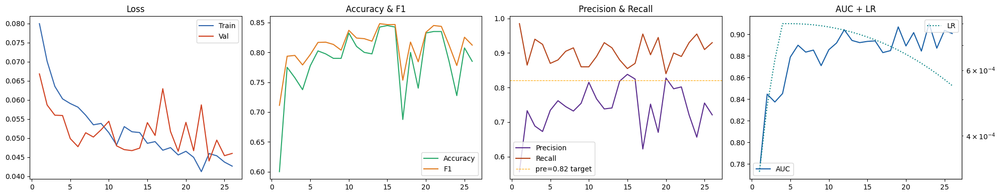

Best F1: 0.8482  Best Pre: 0.8382  Best AUC: 0.9098


In [15]:
if not SKIP_TRAINING and os.path.exists(HISTORY_PATH):
    h  = np.load(HISTORY_PATH, allow_pickle=True).item()
    ep = range(1, len(h['train_loss'])+1)
    fig, axes = plt.subplots(1, 4, figsize=(20, 4))

    axes[0].plot(ep, h['train_loss'], label='Train', color='#3266ad')
    axes[0].plot(ep, h['val_loss'],   label='Val',   color='#d04020')
    axes[0].set_title('Loss'); axes[0].legend()

    axes[1].plot(ep, h['acc'], label='Accuracy', color='#27a869')
    axes[1].plot(ep, h['f1'],  label='F1',       color='#e07b1f')
    axes[1].set_title('Accuracy & F1'); axes[1].legend()

    axes[2].plot(ep, h['pre'], label='Precision', color='#5b2d8e')
    axes[2].plot(ep, h['rec'], label='Recall',    color='#b5451b')
    axes[2].axhline(0.82, color='orange', ls='--', lw=0.8, label='pre=0.82 target')
    axes[2].set_title('Precision & Recall'); axes[2].legend()

    axes[3].plot(ep, h['auc'], color='#185fa5', label='AUC')
    ax2 = axes[3].twinx()
    ax2.plot(ep, h['lr'], color='teal', ls=':', label='LR')
    ax2.set_yscale('log')
    axes[3].set_title('AUC + LR'); axes[3].legend(loc='lower left')
    ax2.legend(loc='upper right')

    plt.tight_layout()
    plt.savefig('/content/training_v3.png', dpi=120, bbox_inches='tight')
    plt.show()
    print(f'Best F1: {max(h["f1"]):.4f}  Best Pre: {max(h["pre"]):.4f}  Best AUC: {max(h["auc"]):.4f}')


## Inference

In [16]:
mean_inf = np.load(MEAN_PATH).astype(np.float32)
std_inf  = np.load(STD_PATH).astype(np.float32)

inf_model = ViolenceDetectorV3().to(device_torch)
inf_model.load_state_dict(torch.load(MODEL_PATH, map_location=device_torch))
inf_model.eval()

inf_pose    = YOLO('yolov8s-pose.pt')
inf_tracker = sv.ByteTrack()
print(f'Model loaded | Norm shape: {mean_inf.shape}')

Model loaded | Norm shape: (126,)


Fight: 100%|██████████| 200/200 [00:01<00:00, 110.74it/s]


Optimal threshold : 0.519  (precision >= 0.82)
Warning threshold : 0.369
F1=0.8543  Pre=0.8439  Rec=0.8650  AUC=0.8922
FPR: 16.0%  |  FNR: 13.5%

              precision    recall  f1-score   support

    NonFight       0.86      0.84      0.85       200
       Fight       0.84      0.86      0.85       200

    accuracy                           0.85       400
   macro avg       0.85      0.85      0.85       400
weighted avg       0.85      0.85      0.85       400


Threshold analysis:
    Thresh       F1      Pre      Rec     FPR%     FNR%
      0.30   0.6689   0.5025   1.0000     99.0      0.0
      0.35   0.7021   0.5440   0.9900     83.0      1.0
      0.40   0.7161   0.5693   0.9650     73.0      3.5
      0.45   0.7715   0.6643   0.9200     46.5      8.0
      0.50   0.8482   0.8186   0.8800     19.5     12.0  <-- chosen
      0.55   0.8426   0.8557   0.8300     14.0     17.0
      0.60   0.8204   0.8844   0.7650     10.0     23.5
      0.65   0.7701   0.9054   0.6700      7.0

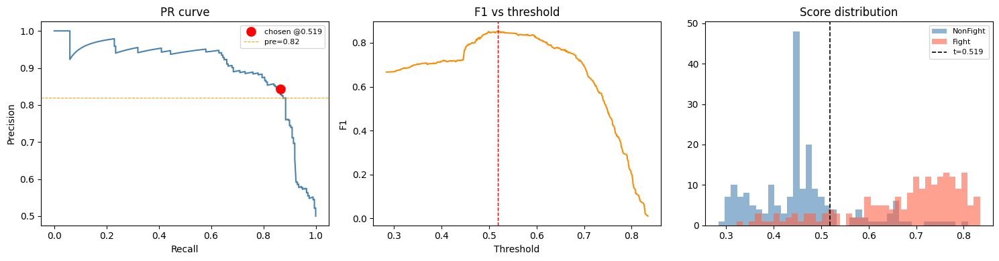

In [17]:
RUN_CALIBRATION = True

if RUN_CALIBRATION:
    all_probs, all_labels = [], []
    for label, cls in enumerate(['NonFight','Fight']):
        folder = os.path.join(VAL_FEAT_DIR, cls)
        for fname in tqdm(sorted(f for f in os.listdir(folder) if f.endswith('.npy')), desc=cls):
            try:
                feat = np.load(os.path.join(folder,fname)).astype(np.float32)
                if feat.shape != (SEQ_LEN, FEATURE_DIM): continue
                feat = (feat - mean_inf) / std_inf
                with torch.no_grad():
                    logit, _ = inf_model(torch.tensor(feat).unsqueeze(0).to(device_torch))
                all_probs.append(float(torch.sigmoid(logit).item()))
                all_labels.append(label)
            except: pass

    prec, rec, threshs = precision_recall_curve(all_labels, all_probs)
    f1s = 2 * prec * rec / (prec + rec + 1e-6)

    # Primary: precision >= 0.82 (tighter than before — fewer false alarms)
    fp_safe_mask = prec[:-1] >= 0.82
    best_i = np.argmax(f1s[:-1] * fp_safe_mask) if fp_safe_mask.any() else np.argmax(f1s[:-1])

    OPTIMAL_THRESHOLD = float(threshs[best_i])
    WARNING_THRESHOLD = max(0.25, OPTIMAL_THRESHOLD - 0.15)

    auc_score = roc_auc_score(all_labels, all_probs)
    preds_opt = [int(p >= OPTIMAL_THRESHOLD) for p in all_probs]
    cm = confusion_matrix(all_labels, preds_opt)
    tn, fp, fn, tp = cm.ravel()

    print(f'Optimal threshold : {OPTIMAL_THRESHOLD:.3f}  (precision >= 0.82)')
    print(f'Warning threshold : {WARNING_THRESHOLD:.3f}')
    print(f'F1={f1s[best_i]:.4f}  Pre={prec[best_i]:.4f}  Rec={rec[best_i]:.4f}  AUC={auc_score:.4f}')
    print(f'FPR: {fp/(fp+tn)*100:.1f}%  |  FNR: {fn/(fn+tp)*100:.1f}%')
    print('\n' + classification_report(all_labels, preds_opt, target_names=['NonFight','Fight']))

    # Show FP/FN tradeoff at multiple thresholds
    print('\nThreshold analysis:')
    print(f'  {"Thresh":>8} {"F1":>8} {"Pre":>8} {"Rec":>8} {"FPR%":>8} {"FNR%":>8}')
    for t in np.arange(0.30, 0.85, 0.05):
        pp = [int(p>=t) for p in all_probs]
        if sum(pp) == 0: continue
        _cm = confusion_matrix(all_labels, pp)
        _tn,_fp,_fn,_tp = _cm.ravel()
        _f1  = f1_score(all_labels, pp, zero_division=0)
        _pre = precision_score(all_labels, pp, zero_division=0)
        _rec = recall_score(all_labels, pp, zero_division=0)
        marker = '  <-- chosen' if abs(t - OPTIMAL_THRESHOLD) < 0.03 else ''
        print(f'  {t:8.2f} {_f1:8.4f} {_pre:8.4f} {_rec:8.4f} '
              f'{_fp/(_fp+_tn)*100:8.1f} {_fn/(_fn+_tp)*100:8.1f}{marker}')

    fig, axes = plt.subplots(1, 3, figsize=(15,4))
    axes[0].plot(rec, prec, color='steelblue', lw=1.5)
    axes[0].scatter(rec[best_i], prec[best_i], color='red', s=90, zorder=5,
                    label=f'chosen @{OPTIMAL_THRESHOLD:.3f}')
    axes[0].axhline(0.82, color='orange', ls='--', lw=0.8, label='pre=0.82')
    axes[0].set_xlabel('Recall'); axes[0].set_ylabel('Precision')
    axes[0].set_title('PR curve'); axes[0].legend(fontsize=8)

    axes[1].plot(threshs, f1s[:-1], color='darkorange', lw=1.5)
    axes[1].axvline(OPTIMAL_THRESHOLD, color='red', ls='--', lw=1)
    axes[1].set_xlabel('Threshold'); axes[1].set_ylabel('F1')
    axes[1].set_title('F1 vs threshold')

    axes[2].hist([p for p,l in zip(all_probs,all_labels) if l==0],
                 bins=40, alpha=0.6, color='steelblue', label='NonFight')
    axes[2].hist([p for p,l in zip(all_probs,all_labels) if l==1],
                 bins=40, alpha=0.6, color='tomato', label='Fight')
    axes[2].axvline(OPTIMAL_THRESHOLD, color='black', ls='--', lw=1.2,
                    label=f't={OPTIMAL_THRESHOLD:.3f}')
    axes[2].set_title('Score distribution'); axes[2].legend(fontsize=8)
    plt.tight_layout(); plt.show()

else:
    OPTIMAL_THRESHOLD = 0.65
    WARNING_THRESHOLD = 0.45
    print(f'Calibration skipped. threshold={OPTIMAL_THRESHOLD}')


In [18]:
_prev_centers={}; _prev_vel={}; _prev_acc={}; _prev_kps={}

def _inf_person_features(kps, tid, x1, y1, x2, y2, kp_conf, W, H):
    xc=(x1+x2)/2/W; yc=(y1+y2)/2/H
    dx=dy=ddx=ddy=dddx=dddy=0.0
    if tid in _prev_centers: px,py=_prev_centers[tid]; dx,dy=xc-px,yc-py
    if tid in _prev_vel:     pdx,pdy=_prev_vel[tid];   ddx,ddy=dx-pdx,dy-pdy
    if tid in _prev_acc:     pddx,pddy=_prev_acc[tid]; dddx,dddy=ddx-pddx,ddy-pddy
    _prev_centers[tid]=(xc,yc); _prev_vel[tid]=(dx,dy); _prev_acc[tid]=(ddx,ddy)
    pf = extract_person_features(kps,_prev_kps.get(tid),xc,yc,x1,y1,x2,y2,
                                  dx,dy,ddx,ddy,dddx,dddy,kp_conf,W,H)
    _prev_kps[tid]=kps.copy()
    return pf,(xc,yc),(dx,dy)

def extract_frame_feature_inf(frame, result, dets):
    H,W=frame.shape[:2]
    if len(dets)==0: return np.zeros(FEATURE_DIM,dtype=np.float32),[]
    dets=dets[dets.class_id==0]
    if len(dets)==0: return np.zeros(FEATURE_DIM,dtype=np.float32),[]
    dets=inf_tracker.update_with_detections(dets)
    indices=np.argsort(-(dets.xyxy[:,2]-dets.xyxy[:,0])*(dets.xyxy[:,3]-dets.xyxy[:,1]))[:2]

    person_feats,centers,velocities,bboxes,kps_list,det_info=[],[],[],[],[],[]
    for idx in indices:
        x1,y1,x2,y2=dets.xyxy[idx]; tid=int(dets.tracker_id[idx])
        det_info.append({'bbox':[int(x1),int(y1),int(x2),int(y2)],'tid':tid})
        bboxes.append([x1,y1,x2,y2])
        try:
            kps=result.keypoints.xy[idx].cpu().numpy().astype(np.float32)
            kp_conf=result.keypoints.conf[idx].cpu().numpy() \
                    if result.keypoints.conf is not None else np.ones(17,dtype=np.float32)
        except:
            kps=np.zeros((17,2),dtype=np.float32); kp_conf=np.zeros(17,dtype=np.float32)
        pf,ctr,vel=_inf_person_features(kps,tid,x1,y1,x2,y2,kp_conf,W,H)
        person_feats.append(pf); centers.append(ctr); velocities.append(vel); kps_list.append(kps)

    while len(person_feats)<2: person_feats.append(np.zeros(PERSON_DIM,dtype=np.float32))
    while len(centers)<2:      centers.append((0.5,0.5))
    while len(velocities)<2:   velocities.append((0.,0.))
    while len(bboxes)<2:       bboxes.append([0.,0.,1.,1.])
    while len(kps_list)<2:     kps_list.append(np.zeros((17,2),dtype=np.float32))

    inter=compute_interaction(centers,velocities,bboxes,kps_list)
    return np.concatenate([person_feats[0],person_feats[1],inter]).astype(np.float32), det_info

print('Inference helpers ready.')

Inference helpers ready.


In [19]:
SKELETON_PAIRS = [
    (0,1),(0,2),(1,3),(2,4),
    (5,6),(5,7),(7,9),(6,8),(8,10),
    (5,11),(6,12),(11,12),
    (11,13),(13,15),(12,14),(14,16)
]

def draw_skeleton(frame, kps, color):
    pts=[(int(kps[i,0]),int(kps[i,1]),kps[i,0]>0 or kps[i,1]>0) for i in range(17)]
    for x,y,v in pts:
        if v: cv2.circle(frame,(x,y),4,color,-1,cv2.LINE_AA)
    for a,b in SKELETON_PAIRS:
        if a<len(pts) and b<len(pts) and pts[a][2] and pts[b][2]:
            cv2.line(frame,pts[a][:2],pts[b][:2],color,2,cv2.LINE_AA)

def draw_attention_bar(frame, attn_weights, w, h, bar_h=18):
    if attn_weights is None: return
    aw=np.array(attn_weights)
    if   aw.ndim==3: wts=aw.mean(axis=(0,2))
    elif aw.ndim==2: wts=aw.mean(axis=0)
    elif aw.ndim==1: wts=aw
    else: return
    wts=wts.flatten()
    if len(wts)==0: return
    wts=(wts-wts.min())/(wts.max()-wts.min()+1e-6)
    step=max(1,w//len(wts)); bar_y=h-bar_h-2
    cv2.rectangle(frame,(0,bar_y-2),(w,h),(20,20,20),-1)
    for t,wt in enumerate(wts):
        x1_=t*step; x2_=min(x1_+step,w)
        cv2.rectangle(frame,(x1_,bar_y),(x2_,bar_y+bar_h),(int((1-wt)*200),40,int(wt*220)),-1)
    cv2.putText(frame,'Attn',(4,bar_y-4),cv2.FONT_HERSHEY_SIMPLEX,0.35,(200,200,200),1)

def draw_hud(frame, raw_prob, ema_prob, status, person_scores, fps_val, frame_no):
    h,w=frame.shape[:2]
    overlay=frame.copy()
    cv2.rectangle(overlay,(8,8),(300,130),(20,20,20),-1)
    cv2.addWeighted(overlay,0.65,frame,0.35,0,frame)

    scol=(30,30,230) if status=='VIOLENCE' else (30,165,240) if status=='WARNING' else (60,200,60)
    cv2.putText(frame,status,(16,34),cv2.FONT_HERSHEY_DUPLEX,0.9,scol,2,cv2.LINE_AA)

    blen=240; bx,by=16,48
    cv2.rectangle(frame,(bx,by),(bx+blen,by+14),(60,60,60),-1)
    bcol=(30,30,230) if ema_prob>0.6 else (30,165,240) if ema_prob>0.4 else (60,200,60)
    cv2.rectangle(frame,(bx,by),(bx+int(ema_prob*blen),by+14),bcol,-1)
    cv2.putText(frame,f'{ema_prob*100:.1f}%',(bx+blen+6,by+12),
                cv2.FONT_HERSHEY_SIMPLEX,0.45,(220,220,220),1)
    cv2.putText(frame,f'Raw:{raw_prob*100:.1f}%  FPS:{fps_val:.1f}  F:{frame_no}',
                (16,80),cv2.FONT_HERSHEY_SIMPLEX,0.37,(180,180,180),1)

    for pi,(tid,score) in enumerate(person_scores[:2]):
        py_=96+pi*16
        cv2.putText(frame,f'P{pi+1}#{tid}',(16,py_),cv2.FONT_HERSHEY_SIMPLEX,0.34,(160,160,160),1)
        plen=140; px_=60
        cv2.rectangle(frame,(px_,py_-10),(px_+plen,py_-2),(50,50,50),-1)
        pcol=(30,30,230) if score>0.6 else (30,165,240) if score>0.35 else (60,200,60)
        cv2.rectangle(frame,(px_,py_-10),(px_+int(score*plen),py_-2),pcol,-1)
        cv2.putText(frame,f'{score*100:.0f}%',(px_+plen+4,py_-2),
                    cv2.FONT_HERSHEY_SIMPLEX,0.32,(180,180,180),1)

print('Visualization helpers ready.')

Visualization helpers ready.


### Stable face recognition

Identity labels use confirmation and release hysteresis to prevent frame-to-frame flicker.


In [ ]:
# Stable face identity integration. The recognizer applies acquisition and
# release hysteresis, so short detector misses do not make labels flicker.
import sys
from pathlib import Path

_face_module_candidates = [Path.cwd() / 'threat_system', Path.cwd().parent / 'threat_system']
THREAT_SYSTEM_DIR = next((path for path in _face_module_candidates if path.is_dir()), _face_module_candidates[0])
assert THREAT_SYSTEM_DIR.is_dir(), f'Cannot find threat_system directory from {Path.cwd()}'
sys.path.insert(0, str(THREAT_SYSTEM_DIR))

from identity.recognizer import FaceIdentityRecognizer

FACE_DB_PATH = THREAT_SYSTEM_DIR / 'models' / 'faces'
face_recognizer = FaceIdentityRecognizer(database_dir=FACE_DB_PATH, verbose=True)
print(f'Stable face recognition ready: {FACE_DB_PATH}')



In [20]:
def run_inference(video_path,
                  output_path='/content/output_v3.mp4',
                  violence_threshold=None,
                  warning_threshold=None,
                  ema_alpha=0.20,
                  export_json=True):
    """
    ema_alpha      : 0.20 = smooth (less reactive). Raise to 0.35 for faster response.
    export_json    : saves per-frame dict for weapon/loitering fusion layer.

    False positive fixes applied here:
      1. FP-conservative threshold from calibration (precision >= 0.80).
      2. Cold-start guard: no prediction for first 30 frames (buffer warming up).
      3. Sustained alert: VIOLENCE only if EMA >= threshold for 5 consecutive frames.
      4. Motion-context gate: if only 1 person detected, threshold is raised by 0.10
         (single-person high motion should not trigger violence).
    """
    global _prev_centers,_prev_vel,_prev_acc,_prev_kps
    _prev_centers.clear();_prev_vel.clear();_prev_acc.clear();_prev_kps.clear()
    inf_tracker.reset()
    face_recognizer.reset()

    v_thresh = violence_threshold if violence_threshold is not None else OPTIMAL_THRESHOLD
    w_thresh = warning_threshold  if warning_threshold  is not None else WARNING_THRESHOLD

    cap=cv2.VideoCapture(video_path)
    if not cap.isOpened(): print(f'Cannot open {video_path}'); return

    fps=cap.get(cv2.CAP_PROP_FPS) or 25
    W=int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)); H=int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total=int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f'Input: {W}x{H} {fps:.1f}fps ~{total} frames')
    print(f'Thresholds: violence={v_thresh:.3f}  warning={w_thresh:.3f}')

    temp='/content/_tmp_v3.mp4'
    writer=cv2.VideoWriter(temp,cv2.VideoWriter_fourcc(*'mp4v'),fps/2,(W,H))
    SKEL_COLS=[(80,210,255),(255,170,60),(100,255,100),(255,100,200)]

    buffer=deque(maxlen=SEQ_LEN)
    ema_prob=0.0; raw_prob=0.0; last_weights=None
    person_ema=defaultdict(float)
    frame_idx=0; processed=0; t_last=time.time(); fps_disp=0.0
    timeline=[]

    # False positive fix 3: sustained alert counter
    consec_alert=0; ALERT_FRAMES_REQUIRED=5
    confirmed_violence=False

    with tqdm(total=total//2,unit='frame') as pbar:
        while True:
            ret,frame=cap.read()
            if not ret: break
            frame_idx+=1
            if frame_idx%2!=0: continue
            processed+=1

            result=inf_pose(frame,device=device_yolo,conf=0.25,verbose=False)[0]
            dets=sv.Detections.from_ultralytics(result)
            feat,det_info=extract_frame_feature_inf(frame,result,dets)
            person_bboxes={info['tid']:info['bbox'] for info in det_info}
            identity_results=face_recognizer.update(frame,person_bboxes)
            buffer.append(feat)

            # FP fix 2: cold-start guard — skip prediction while buffer warming
            if len(buffer)==SEQ_LEN and processed>30:
                seq=(np.stack(list(buffer)).astype(np.float32)-mean_inf)/std_inf
                with torch.no_grad():
                    logit,attn_w=inf_model(torch.tensor(seq).unsqueeze(0).to(device_torch))
                raw_prob=float(torch.sigmoid(logit).item())
                last_weights=attn_w[0].cpu().numpy()

            ema_prob=ema_alpha*raw_prob+(1-ema_alpha)*ema_prob

            # FP fix 4: single-person motion gate
            num_persons=len(det_info)
            effective_thresh=v_thresh+(0.10 if num_persons<2 else 0.0)

            # FP fix 3: require N consecutive frames above threshold
            if ema_prob>=effective_thresh:
                consec_alert+=1
            else:
                consec_alert=max(0,consec_alert-1)
            confirmed_violence=consec_alert>=ALERT_FRAMES_REQUIRED

            status=('VIOLENCE' if confirmed_violence else
                    'WARNING'  if ema_prob>=w_thresh  else 'NORMAL')

            # Per-person threat scores
            inter_feat=feat[PERSON_DIM*2:]
            approach_sig=max(0.0,-float(inter_feat[1]))
            iou_sig=float(inter_feat[2])
            pp_sig=min(1.0,ema_prob*(1+approach_sig+iou_sig))
            person_scores=[]
            for info in det_info[:2]:
                tid=info['tid']
                person_ema[tid]=ema_alpha*pp_sig+(1-ema_alpha)*person_ema[tid]
                person_scores.append((tid,person_ema[tid]))

            # Draw
            for pi,info in enumerate(det_info[:2]):
                x1,y1,x2,y2=info['bbox']; tid=info['tid']
                col=SKEL_COLS[pi%len(SKEL_COLS)]
                box_col=(30,30,230) if status=='VIOLENCE' else (30,165,240) if status=='WARNING' else col
                cv2.rectangle(frame,(x1,y1),(x2,y2),box_col,2,cv2.LINE_AA)
                identity=identity_results.get(tid,{})
                identity_name=identity.get('identity_name','unknown')
                cv2.putText(frame,f'P{pi+1}#{tid} {identity_name}',(x1,y1-6),cv2.FONT_HERSHEY_SIMPLEX,0.4,col,1,cv2.LINE_AA)
                try: draw_skeleton(frame,result.keypoints.xy[pi].cpu().numpy(),col)
                except: pass

            now=time.time(); fps_disp=1.0/max(now-t_last,1e-6); t_last=now
            draw_hud(frame,raw_prob,ema_prob,status,person_scores,fps_disp,processed)
            draw_attention_bar(frame,last_weights,W,H)
            writer.write(frame)

            timeline.append({
                'frame'          : processed,
                'timestamp_s'    : round(processed/(fps/2),3),
                'violence_raw'   : round(raw_prob,4),
                'violence_smooth': round(ema_prob,4),
                'status'         : status,
                'confirmed'      : confirmed_violence,
                'persons'        : [{'track_id':info['tid'],'bbox':info['bbox'],
                                     'threat':round(person_ema[info['tid']],4),
                                     'identity_name':identity_results.get(info['tid'],{}).get('identity_name','unknown'),
                                     'identity_confidence':identity_results.get(info['tid'],{}).get('identity_confidence',0.0)}
                                    for info in det_info[:2]],
                'interaction'    : {
                    'distance'     : round(float(feat[PERSON_DIM*2+0]),4),
                    'approach_vel' : round(float(feat[PERSON_DIM*2+1]),4),
                    'bbox_iou'     : round(float(feat[PERSON_DIM*2+2]),4),
                    'heading_align': round(float(feat[PERSON_DIM*2+4]),4),
                }
            })
            pbar.update(1)

    cap.release(); writer.release()
    os.system(f'ffmpeg -y -loglevel error -i {temp} -vcodec libx264 -crf 22 -preset fast {output_path}')
    os.remove(temp)

    if export_json:
        jp=output_path.replace('.mp4','_events.json')
        json.dump(timeline, open(jp,'w'), indent=2)
        print(f'JSON saved: {jp}')

    probs=[t['violence_smooth'] for t in timeline]
    alert_f=sum(1 for t in timeline if t['confirmed'])
    print(f'\nOutput  : {output_path}')
    print(f'Peak    : {max(probs)*100:.1f}%  |  Mean: {sum(probs)/len(probs)*100:.1f}%')
    print(f'Alerts  : {alert_f}/{len(timeline)} frames ({alert_f/len(timeline)*100:.1f}%)')

    frames=[t['frame'] for t in timeline]
    smooth=[t['violence_smooth'] for t in timeline]
    raw   =[t['violence_raw']    for t in timeline]
    fig,ax=plt.subplots(figsize=(14,3))
    ax.fill_between(frames,0,1,where=[t['confirmed'] for t in timeline],
                    alpha=0.20,color='red',label='VIOLENCE (confirmed)')
    ax.fill_between(frames,0,1,where=[w_thresh<=s<v_thresh for s in smooth],
                    alpha=0.12,color='orange',label='WARNING')
    ax.plot(frames,raw,color='#aaa',lw=0.7,alpha=0.6,label='raw')
    ax.plot(frames,smooth,color='#d04020',lw=1.8,label='EMA smooth')
    ax.axhline(v_thresh,color='red',ls='--',lw=0.9,alpha=0.6)
    ax.axhline(w_thresh,color='orange',ls='--',lw=0.9,alpha=0.6)
    ax.set_xlim(frames[0],frames[-1]); ax.set_ylim(0,1)
    ax.set_xlabel('Frame'); ax.set_ylabel('Violence probability')
    ax.set_title('Temporal violence probability'); ax.legend(fontsize=8)
    plt.tight_layout()
    plt.savefig(output_path.replace('.mp4','_timeline.png'),dpi=130); plt.show()

    from base64 import b64encode
    vb64=b64encode(open(output_path,'rb').read()).decode()
    display(HTML(f'''
    <div style="margin:12px 0">
      <p style="font-family:monospace;font-size:13px;color:#555">{output_path}</p>
      <video width="720" controls autoplay loop
             style="border-radius:8px;border:1px solid #ddd;max-width:100%">
        <source src="data:video/mp4;base64,{vb64}" type="video/mp4">
      </video>
    </div>
    '''))
    return timeline

print('run_inference ready.')

run_inference ready.


## Run Inference

Pick one option (A, B, or C) then run the inference cell.

In [31]:
# Option A — upload from computer
from google.colab import files as colab_files
uploaded=colab_files.upload()
if uploaded:
    VIDEO_PATH=f'/content/{list(uploaded.keys())[0]}'
    print(f'Ready: {VIDEO_PATH}')

Saving f2.mp4 to f2.mp4
Ready: /content/f2.mp4


In [ ]:
# Option B — Drive path
# VIDEO_PATH = '/content/drive/MyDrive/test_videos/my_video.mp4'

Input: 480x832 30.0fps ~928 frames
Thresholds: violence=0.519  warning=0.369


100%|██████████| 464/464 [00:15<00:00, 29.33frame/s]


JSON saved: /content/output_v3_events.json

Output  : /content/output_v3.mp4
Peak    : 83.4%  |  Mean: 68.3%
Alerts  : 397/464 frames (85.6%)


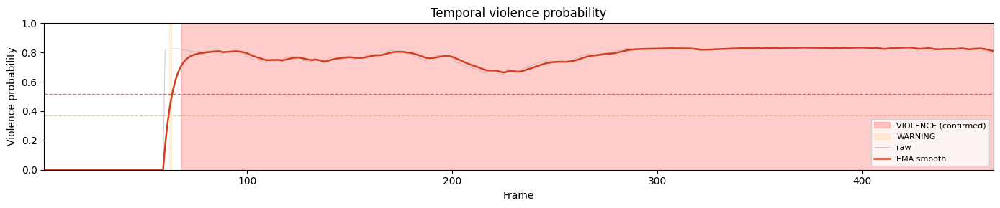

In [32]:
assert 'VIDEO_PATH' in dir() and os.path.exists(VIDEO_PATH), 'Set VIDEO_PATH first.'

timeline = run_inference(
    video_path         = VIDEO_PATH,
    output_path        = '/content/output_v3.mp4',
    violence_threshold = None,   # uses calibrated threshold
    warning_threshold  = None,
    ema_alpha          = 0.20,
    export_json        = True
)

In [ ]:
if timeline:
    alerts=[t for t in timeline if t['confirmed']]
    print(f'Total frames : {len(timeline)}')
    print(f'VIOLENCE     : {len(alerts)}')
    if alerts:
        print('\nFirst 3 confirmed alerts:')
        for t in alerts[:3]: print(json.dumps(t, indent=2))

In [ ]:
# colab_files.download('/content/output_v3.mp4')